In [1]:
import sys
import os
sys.path.append("/home/nathan/dev/UmmonDevEnv/")
import matplotlib.pyplot as plt
from UDE.util.helper import toggle_mask
from UDE.util.fuzzy import fuz
from UDE.util.converter import Mask
import segmentation_models as sm
sm.set_framework('tf.keras')
import numpy as np
import imgaug.augmenters as iaa
import tensorflow as tf
from PIL import Image
import cv2
from datetime import datetime

/home/nathan/.local/lib/python3.8/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


Segmentation Models: using `keras` framework.


In [2]:
ROOT = "/home/nathan/Desktop/data/dl_data/best/humanchecked/"
MODEL = "/home/nathan/Desktop/data/dl_data/best/generator.h5"
OUTPUT = "/home/nathan/Desktop/data/dl_data/monitoring/set2"

In [3]:
model = sm.Unet("efficientnetb0", activation="softmax",
                input_shape=(224, 224, 3), encoder_weights='imagenet',
               classes=3)

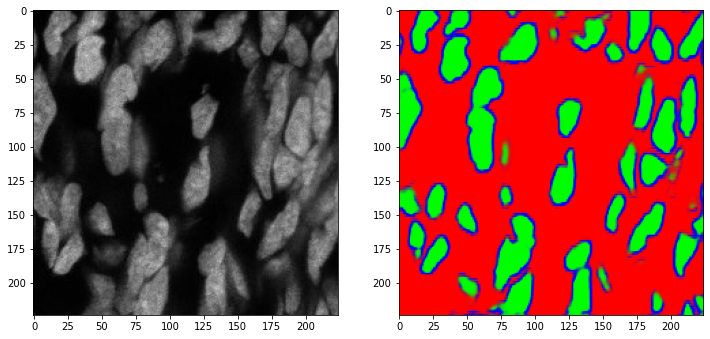

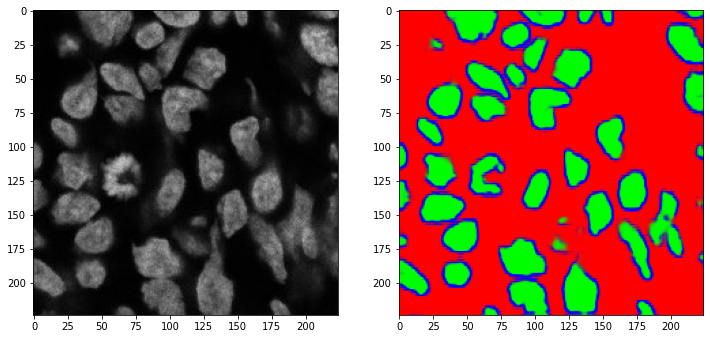

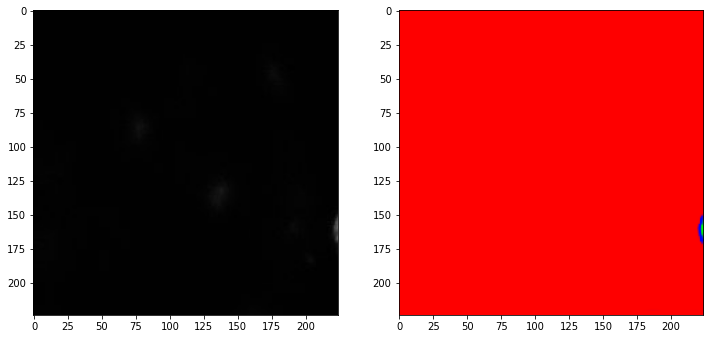

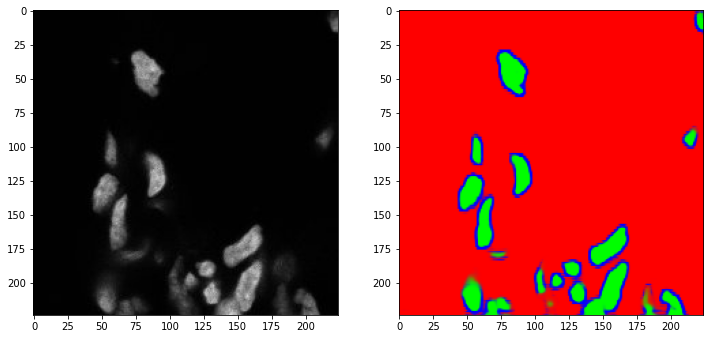

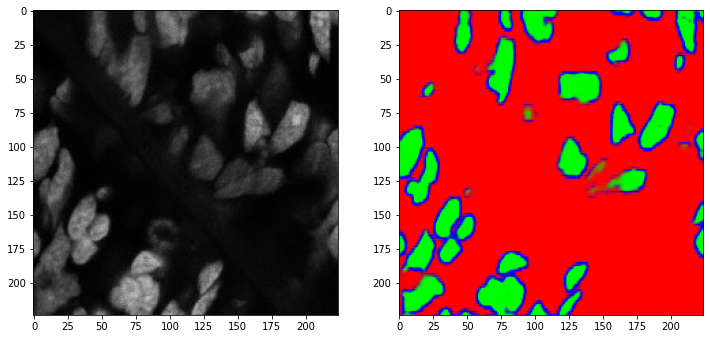

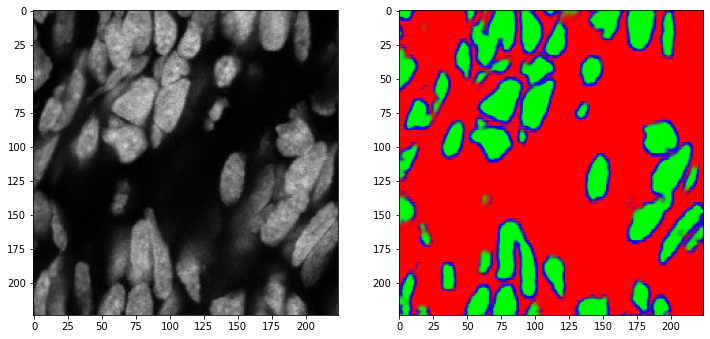

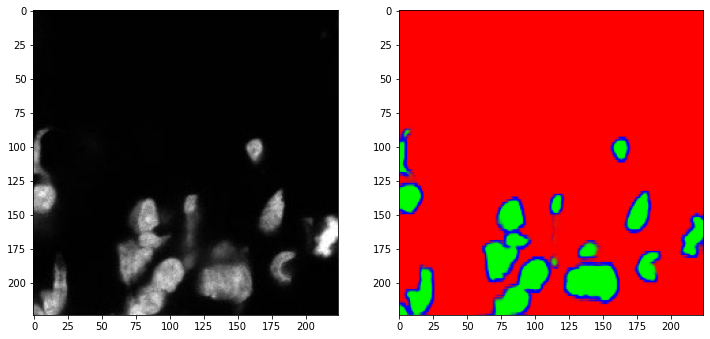

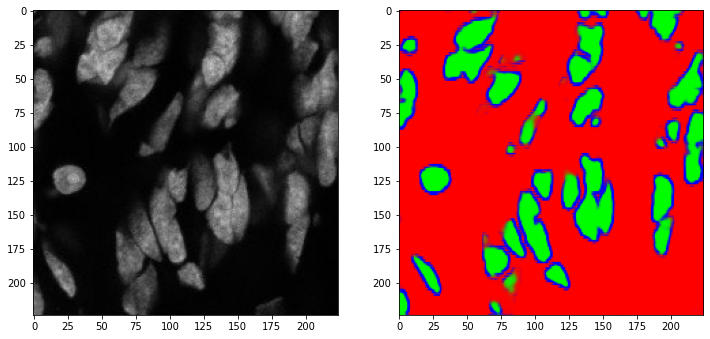

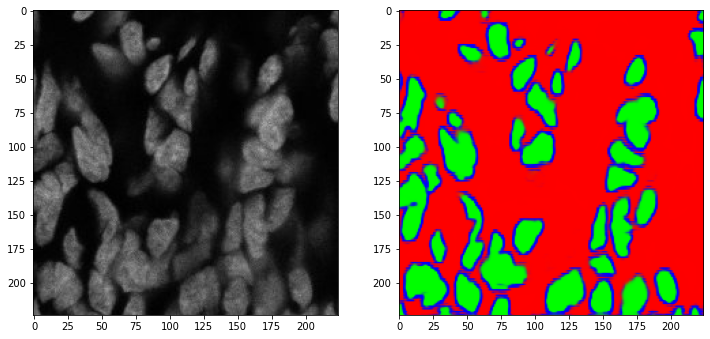

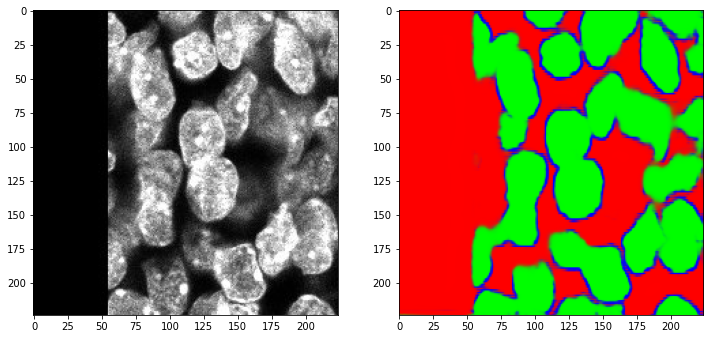

In [4]:
model.load_weights(MODEL)
images = [x for x in os.listdir(ROOT) if "mask" not in x]
for i in range(10, 20):
    x = fuz.fuzzyopen(os.path.join(ROOT, images[i]))
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(x)
    plt.subplot(1, 2, 2)
    y = model.predict(np.array([x / 255.]))
    plt.imshow(y[0])
    plt.show()

In [5]:
convd = {
    0: [0] * 3,
    1: [33] * 3,
    2: [12] * 3,
}

reverse_convd = {tuple(v): k for k, v in convd.items()}

def quickload(im_mask):
    m = Mask(im_mask)
    mask = m.convert_from_dict(reverse_convd, lastchannel_shape=(), cval=0)
    return mask

In [6]:
def shape3(image):
    if image.ndim != 3:
        image = image.reshape(image.shape + (1,))

    if image.shape[2] == 1:
        image = np.repeat(image, 3, axis=2)

    return image

In [7]:
# train again splitting 0.8
# using augmentation

augmentation_policy =  iaa.Sequential([
    iaa.ScaleX(scale=(0.8, 1.2)),
    iaa.ScaleY(scale=(0.8, 1.2)),
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5),
    iaa.Rot90([0, 1, 2, 3]),
    # iaa.PiecewiseAffine(scale=(0.0, 0.04), nb_rows=(2, 4), nb_cols=(2, 4)),
    # iaa.pooling.AveragePooling(kernel_size=(1, 2)),
])


import numpy as np
import keras

class DataGenerator(keras.utils.data_utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, batch_size=4, dim=(224,224), n_channels=3,
                 n_classes=3, shuffle=True, augmenter=None, root="."):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.augmenter = augmenter
        self.root = root
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels), dtype=float)
        y = np.empty((self.batch_size, *self.dim, self.n_classes), dtype=np.int32)

        # Generate data
        for i, p in enumerate(list_IDs_temp):
            path = os.path.join(self.root, p)
            # Store sample
            X_ = fuz.fuzzyopen(path)
            X_ = shape3(X_)[:224,:224,:3] / 255.

            # Store class
            mask = fuz.fuzzyopen(toggle_mask(path))
            mask = quickload(mask)
            y_ = tf.keras.utils.to_categorical(mask, num_classes=self.n_classes)
            
            X[i,], y[i,] = X_, y_
            
        if self.augmenter:
            X, y = self.augmenter(images=X, segmentation_maps=y)

        return X, y.astype('float')

In [8]:
list_ids = [x for x in os.listdir(ROOT) if "_mask" not in x]
split = len(list_ids)  # int(0.8 * len(list_ids))
batch_size = 4

gen = DataGenerator(list_ids[:split], augmenter=augmentation_policy, batch_size=batch_size, root=ROOT)
valgen = DataGenerator(list_ids[split:], augmenter=augmentation_policy, batch_size=batch_size, root=ROOT)
print(len(gen), len(valgen))

27 0


## Segmentation using GAN

Now that we have enough samples (between 100 and 200), we can consider using a GAN to fine tune our U-net model and have more realistic prediction. This is supposed to prevent the model from predicting an average of what could be possible.

This should be useful because our annotations are very imperfect because either a stain is a cell shall be defined as a cell or not is quite experimentator-dependant. However, we only care about cells that are properly labelled, because other will be removed because of their low signal.

Todolist:
- Make a discriminator model with a efficientnet
- Make a generator model using U-net
- Make a GAN model using both of them


To set multiple output and multiple loss  
1) Name the output layer in order to find it back  
2) Define the loss and loss weight from the name of the output  
```python 
losses = {
	"category_output": "categorical_crossentropy",
	"color_output": "categorical_crossentropy",
}
lossWeights = {"category_output": 1.0, "color_output": 1.0}
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(optimizer=opt, loss=losses, loss_weights=lossWeights,
	metrics=["accuracy"])
```
3) Fit using multiple categories
```python
H = model.fit(x=trainX,
	y={"category_output": trainCategoryY, "color_output": trainColorY},
	validation_data=(testX,
		{"category_output": testCategoryY, "color_output": testColorY}),
	epochs=EPOCHS,
	verbose=1)
```

To do it fom sequence, I think we shall do :
`return X, {"mask_layer": mask, "discriminator_layer": disc}` instead of `return X, y`

In [9]:
import gc
gc.collect()

28846

In [10]:
# We should concatenate the image with the segmentation map so as the discriminator can help
# the generator finding the right configuration for a specific image, and no only having a great shape


import tensorflow as tf
discriminator = tf.keras.applications.efficientnet.EfficientNetB0(classes=1, weights=None,
                                                                  input_shape=(224, 224, 3),
                                                                 classifier_activation='sigmoid')
opt = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
discriminator.compile(loss='binary_crossentropy', optimizer=opt)

/home/nathan/.local/lib/python3.8/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:374: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


In [11]:
generator = sm.Unet("efficientnetb0", activation="softmax",
                input_shape=(224, 224, 3), encoder_weights='imagenet',
               classes=3)
generator.load_weights(MODEL)
generator.compile(optimizer="Adam", loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])

In [12]:
def define_gan(generator, discriminator):
    discriminator.trainable = False
    gan_output = discriminator(generator.output)
    model = tf.keras.models.Model(generator.input, gan_output)
    opt = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model
    
GAN = define_gan(generator, discriminator)

In [13]:
def generate_d_samples(gen, valgen, g_model, batch_size=4):
    a = np.random.randint(len(gen))
    b = np.random.randint(len(valgen))
    # to select first or second part of a batch
    pick_a, pick_b = np.random.randint(2), np.random.randint(2)
    half = int(batch_size / 2)
    output_fake = g_model.predict(gen[a][0])[pick_a * half:(pick_a + 1) * half]
    output_real = valgen[b][1][pick_b * half:(pick_b + 1) * half]
    X = np.array(list(output_fake) + list(output_real))
    y = np.array([[0] for i in range(half)] + [[1] for i in range(half)])
    return X, y

In [14]:
def viz_segment(segmenter, valgen, idx=0, name=None):
    plt.figure(figsize=(9, 12))
    image0, gt0 = valgen[0]
    image1, gt1 = valgen[1]
    image2, gt2 = valgen[2]
    image = np.concatenate((image0, image1, image2))
    gt = np.concatenate((gt0, gt1, gt2))
    preds = segmenter.predict(image)
    # show 4 pictures
    n_pic = 4
    for i in range(n_pic):
        plt.subplot(n_pic, 3, i*3 + 1)
        plt.imshow(image[i])
        plt.subplot(n_pic, 3, i*3 + 2)
        plt.imshow(gt[i])
        plt.subplot(n_pic, 3, i*3 + 3)
        plt.imshow(preds[i])
        
    if name:
        plt.savefig(name)

In [15]:
X_sample, y_sample = generate_d_samples(gen, gen, generator)

In [16]:
y_sample

array([[0],
       [0],
       [1],
       [1]])

In [17]:
# train the generator and discriminator
def train(g_model, d_model, gan_model, gen, valgen, n_epochs=40, n_batch=4, root="."):
    bat_per_epo = len(gen)
    
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # train segmentation for generator
            batch = gen[j]
            seg_loss, _ = g_model.train_on_batch(x=batch[0], y=batch[1])
            
            # generate examples
            X_sample, y_sample = generate_d_samples(gen, gen, g_model)
            # update discriminator model weights
            d_loss = d_model.train_on_batch(X_sample, y_sample)

            # create inverted labels for the fake samples
            y_gan = np.ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(gen[j][0], y_gan)
            # print(seg_loss, d_loss, g_loss)
            # summarize loss on this batch
            print('>%d, %d/%d, d=%.3f, g=%.3f, s=%.3f' %
                (i+1, j+1, bat_per_epo, d_loss, g_loss, seg_loss))
            
        # SAVE ALL MODEL
        g_model.save_weights(os.path.join(root, f'generator_model_twice_{i}.h5'))
        d_model.save_weights(os.path.join(root, f'discriminator_model_twice_{i}.h5'))
        gan_model.save_weights(os.path.join(root, f'gan_model_twice_{i}.h5'))
        
        viz_segment(generator, gen, idx=0, name=os.path.join(root, f"image_gan_twice_{i}.png"))

>1, 1/27, d=1.371, g=0.696, s=0.567
>1, 2/27, d=1.756, g=0.686, s=0.428
>1, 3/27, d=2.527, g=0.648, s=0.511
>1, 4/27, d=2.097, g=0.687, s=0.638
>1, 5/27, d=1.784, g=0.752, s=0.522
>1, 6/27, d=0.030, g=0.814, s=0.499
>1, 7/27, d=0.027, g=0.950, s=0.566
>1, 8/27, d=1.943, g=1.066, s=0.413
>1, 9/27, d=2.123, g=1.090, s=0.448
>1, 10/27, d=0.010, g=0.959, s=0.451
>1, 11/27, d=10.551, g=0.580, s=0.518
>1, 12/27, d=6.079, g=0.578, s=0.522
>1, 13/27, d=0.615, g=0.711, s=0.536
>1, 14/27, d=1.013, g=0.886, s=0.443
>1, 15/27, d=0.461, g=0.905, s=0.464
>1, 16/27, d=0.011, g=0.881, s=0.504
>1, 17/27, d=0.018, g=0.898, s=0.489
>1, 18/27, d=0.056, g=1.003, s=0.373
>1, 19/27, d=0.826, g=0.750, s=0.511
>1, 20/27, d=1.615, g=1.034, s=0.435
>1, 21/27, d=1.006, g=1.829, s=0.543
>1, 22/27, d=1.349, g=2.232, s=0.389
>1, 23/27, d=7.353, g=2.341, s=0.619
>1, 24/27, d=2.929, g=1.731, s=0.470
>1, 25/27, d=0.002, g=1.506, s=0.428
>1, 26/27, d=3.017, g=0.702, s=0.500
>1, 27/27, d=1.953, g=0.856, s=0.459
>2, 1/27,

>9, 9/27, d=0.195, g=3.879, s=0.426
>9, 10/27, d=0.154, g=4.259, s=0.529
>9, 11/27, d=0.218, g=5.815, s=0.493
>9, 12/27, d=0.051, g=2.914, s=0.510
>9, 13/27, d=0.664, g=6.886, s=0.603
>9, 14/27, d=0.946, g=3.465, s=0.445
>9, 15/27, d=0.001, g=3.480, s=0.613
>9, 16/27, d=0.122, g=2.161, s=0.495
>9, 17/27, d=0.002, g=1.606, s=0.450
>9, 18/27, d=1.198, g=0.003, s=0.399
>9, 19/27, d=2.166, g=0.202, s=0.537
>9, 20/27, d=0.005, g=0.055, s=0.447
>9, 21/27, d=0.453, g=0.972, s=0.535
>9, 22/27, d=4.587, g=7.714, s=0.390
>9, 23/27, d=0.000, g=11.299, s=0.586
>9, 24/27, d=0.000, g=11.834, s=0.473
>9, 25/27, d=2.175, g=10.903, s=0.427
>9, 26/27, d=5.268, g=3.468, s=0.454
>9, 27/27, d=1.382, g=0.371, s=0.465
>10, 1/27, d=0.217, g=0.255, s=0.506
>10, 2/27, d=0.795, g=2.207, s=0.361
>10, 3/27, d=3.138, g=9.235, s=0.471
>10, 4/27, d=0.879, g=12.345, s=0.587
>10, 5/27, d=0.000, g=11.907, s=0.488
>10, 6/27, d=0.021, g=12.442, s=0.457
>10, 7/27, d=0.000, g=15.970, s=0.619
>10, 8/27, d=0.000, g=15.331, s=

>17, 8/27, d=0.486, g=28.860, s=0.417
>17, 9/27, d=0.000, g=22.843, s=0.428
>17, 10/27, d=4.298, g=35.281, s=0.551
>17, 11/27, d=0.014, g=18.949, s=0.439
>17, 12/27, d=0.001, g=18.336, s=0.542
>17, 13/27, d=0.011, g=28.496, s=0.578
>17, 14/27, d=0.878, g=34.287, s=0.363
>17, 15/27, d=0.011, g=25.030, s=0.523
>17, 16/27, d=0.004, g=31.260, s=0.490
>17, 17/27, d=0.002, g=10.203, s=0.449
>17, 18/27, d=0.000, g=28.581, s=0.372
>17, 19/27, d=0.002, g=33.608, s=0.480
>17, 20/27, d=0.000, g=12.426, s=0.429
>17, 21/27, d=0.000, g=17.935, s=0.528
>17, 22/27, d=0.000, g=32.464, s=0.402
>17, 23/27, d=0.137, g=10.557, s=0.551
>17, 24/27, d=0.000, g=49.490, s=0.458
>17, 25/27, d=0.000, g=29.715, s=0.409
>17, 26/27, d=0.000, g=23.422, s=0.497
>17, 27/27, d=0.001, g=22.494, s=0.451
>18, 1/27, d=0.752, g=30.132, s=0.476
>18, 2/27, d=0.041, g=33.322, s=0.347
>18, 3/27, d=2.616, g=11.512, s=0.507
>18, 4/27, d=0.006, g=24.340, s=0.571
>18, 5/27, d=2.061, g=6.976, s=0.482
>18, 6/27, d=0.233, g=24.615, s=0

<ipython-input-14-e615159438f7>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(9, 12))


>22, 1/27, d=0.001, g=29.367, s=0.525
>22, 2/27, d=0.000, g=61.844, s=0.354
>22, 3/27, d=1.977, g=100.219, s=0.501
>22, 4/27, d=0.000, g=61.391, s=0.537
>22, 5/27, d=0.000, g=57.647, s=0.448
>22, 6/27, d=9.549, g=94.040, s=0.514
>22, 7/27, d=0.796, g=30.022, s=0.533
>22, 8/27, d=4.901, g=50.358, s=0.375
>22, 9/27, d=0.000, g=12.479, s=0.420
>22, 10/27, d=0.001, g=32.547, s=0.478
>22, 11/27, d=0.255, g=8.300, s=0.445
>22, 12/27, d=3.103, g=77.551, s=0.533
>22, 13/27, d=0.015, g=60.619, s=0.539
>22, 14/27, d=0.000, g=5.930, s=0.386
>22, 15/27, d=0.000, g=39.785, s=0.505
>22, 16/27, d=0.000, g=0.000, s=0.443
>22, 17/27, d=0.005, g=14.079, s=0.428
>22, 18/27, d=0.002, g=2.204, s=0.364
>22, 19/27, d=0.000, g=3.559, s=0.507
>22, 20/27, d=0.000, g=9.688, s=0.432
>22, 21/27, d=0.002, g=16.337, s=0.560
>22, 22/27, d=0.000, g=3.182, s=0.420
>22, 23/27, d=0.000, g=16.588, s=0.568
>22, 24/27, d=2.543, g=7.789, s=0.466
>22, 25/27, d=0.000, g=87.452, s=0.393
>22, 26/27, d=0.140, g=183.383, s=0.469
>

>29, 25/27, d=0.109, g=23.735, s=0.351
>29, 26/27, d=0.000, g=18.713, s=0.424
>29, 27/27, d=0.000, g=40.554, s=0.450
>30, 1/27, d=0.072, g=31.033, s=0.465
>30, 2/27, d=0.000, g=16.988, s=0.288
>30, 3/27, d=0.000, g=24.855, s=0.508
>30, 4/27, d=0.004, g=36.902, s=0.500
>30, 5/27, d=0.000, g=20.095, s=0.441
>30, 6/27, d=0.000, g=26.586, s=0.445
>30, 7/27, d=0.000, g=45.934, s=0.506
>30, 8/27, d=0.000, g=17.954, s=0.364
>30, 9/27, d=0.000, g=19.220, s=0.441
>30, 10/27, d=0.000, g=29.821, s=0.469
>30, 11/27, d=0.000, g=16.122, s=0.408
>30, 12/27, d=0.000, g=32.010, s=0.512
>30, 13/27, d=0.000, g=31.493, s=0.521
>30, 14/27, d=0.000, g=17.589, s=0.365
>30, 15/27, d=0.474, g=29.543, s=0.493
>30, 16/27, d=0.000, g=26.317, s=0.476
>30, 17/27, d=0.000, g=17.245, s=0.402
>30, 18/27, d=0.000, g=26.427, s=0.335
>30, 19/27, d=0.002, g=23.720, s=0.519
>30, 20/27, d=0.000, g=20.286, s=0.407
>30, 21/27, d=0.005, g=22.145, s=0.517
>30, 22/27, d=0.000, g=25.055, s=0.358
>30, 23/27, d=0.001, g=31.402, s=0

>37, 22/27, d=0.000, g=8.118, s=0.397
>37, 23/27, d=0.000, g=10.722, s=0.551
>37, 24/27, d=0.000, g=9.627, s=0.437
>37, 25/27, d=3.536, g=13.577, s=0.359
>37, 26/27, d=0.000, g=37.235, s=0.447
>37, 27/27, d=0.008, g=15.211, s=0.447
>38, 1/27, d=0.057, g=75.041, s=0.486
>38, 2/27, d=0.001, g=9.839, s=0.309
>38, 3/27, d=0.006, g=28.277, s=0.446
>38, 4/27, d=0.330, g=40.701, s=0.530
>38, 5/27, d=0.428, g=40.413, s=0.456
>38, 6/27, d=0.379, g=53.169, s=0.425
>38, 7/27, d=0.000, g=35.700, s=0.478
>38, 8/27, d=0.000, g=47.765, s=0.377
>38, 9/27, d=0.000, g=15.770, s=0.420
>38, 10/27, d=0.000, g=16.527, s=0.496
>38, 11/27, d=0.021, g=27.747, s=0.447
>38, 12/27, d=0.004, g=58.559, s=0.495
>38, 13/27, d=0.000, g=80.994, s=0.495
>38, 14/27, d=0.000, g=32.775, s=0.357
>38, 15/27, d=0.000, g=52.027, s=0.489
>38, 16/27, d=0.000, g=70.447, s=0.435
>38, 17/27, d=0.000, g=22.471, s=0.416
>38, 18/27, d=1.528, g=38.883, s=0.360
>38, 19/27, d=0.000, g=25.919, s=0.507
>38, 20/27, d=0.286, g=45.239, s=0.40

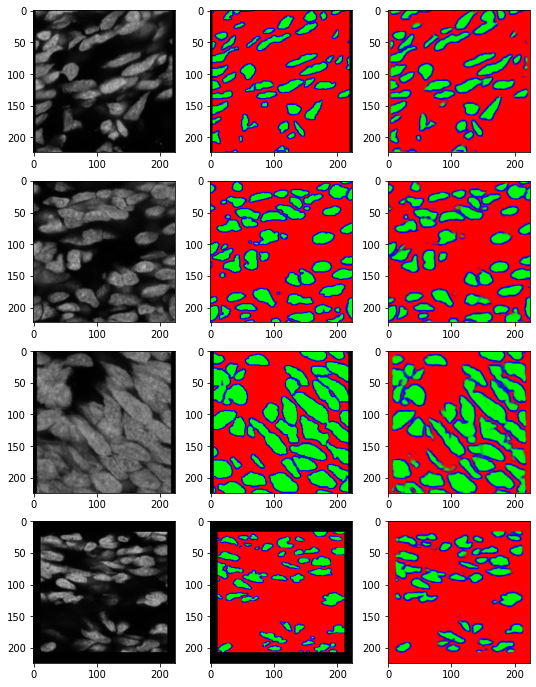

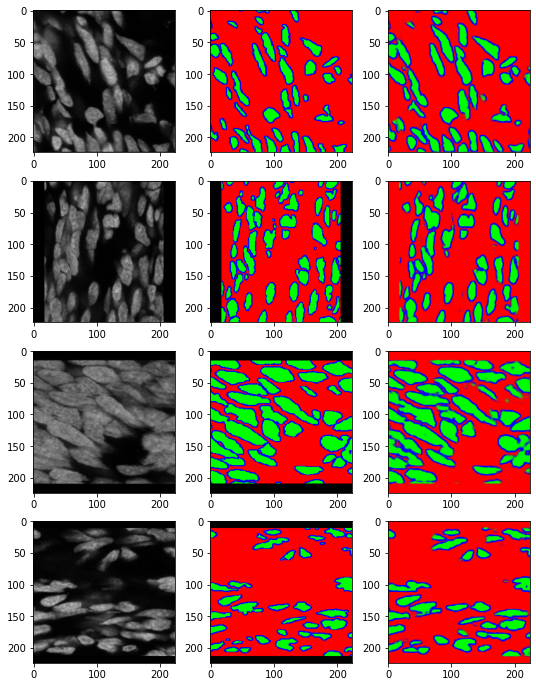

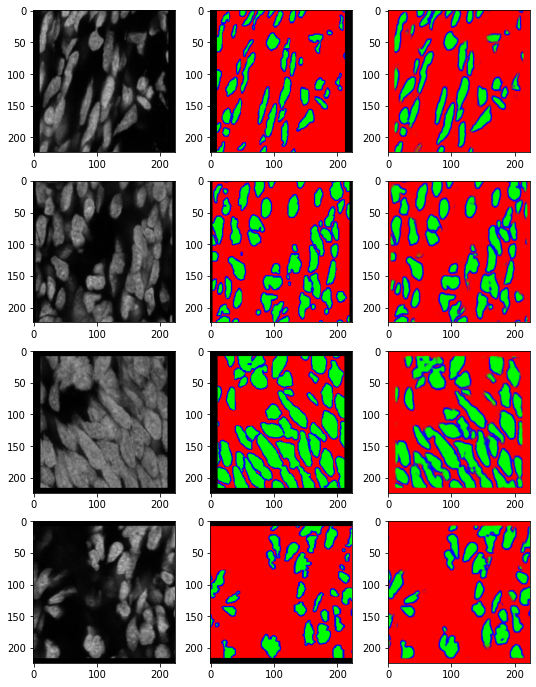

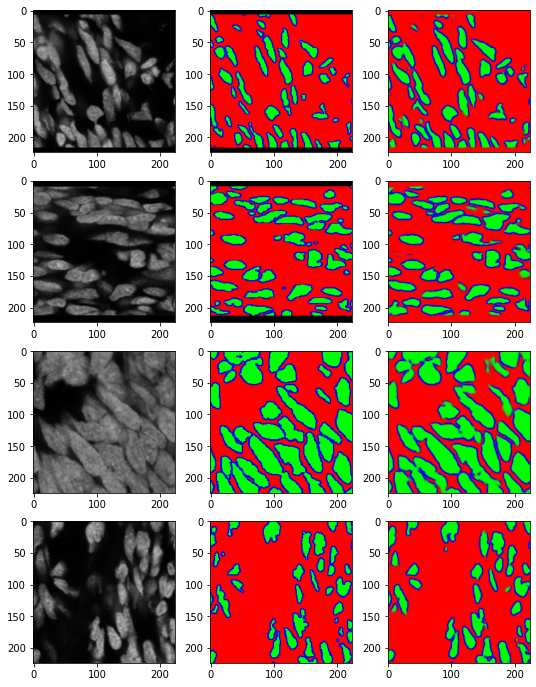

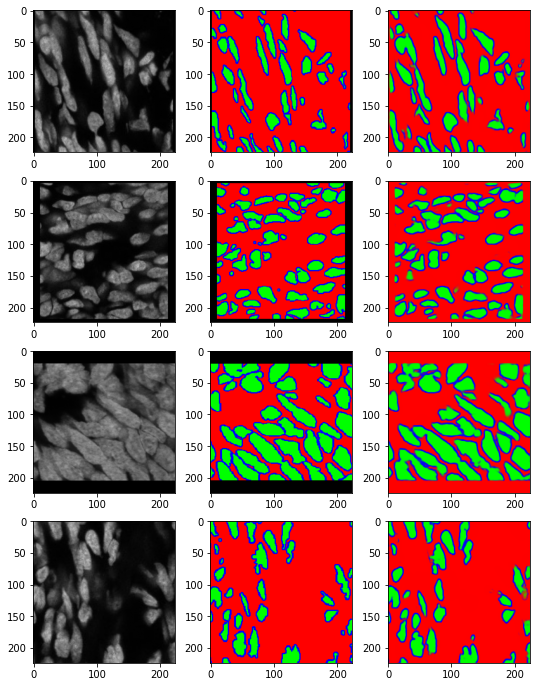

...

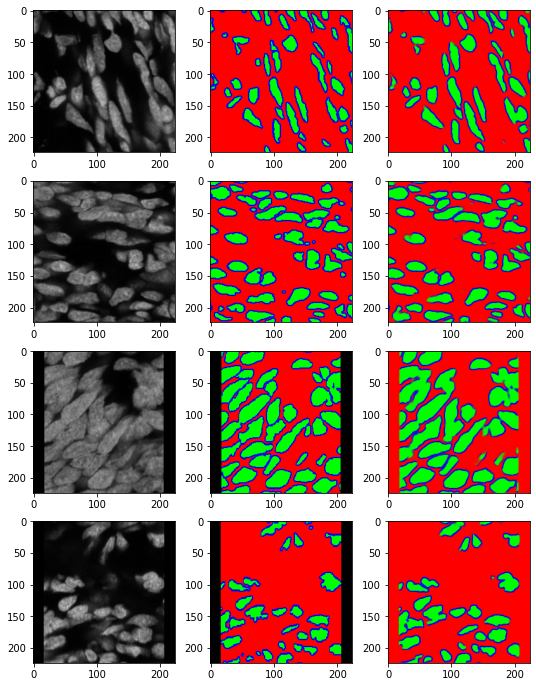

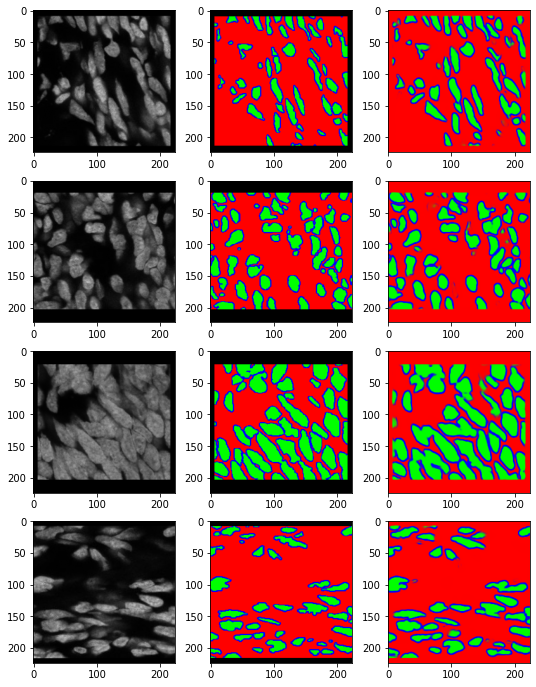

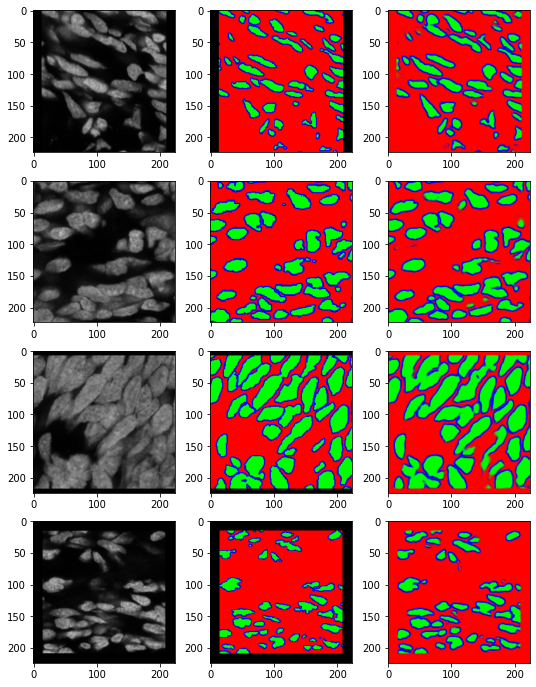

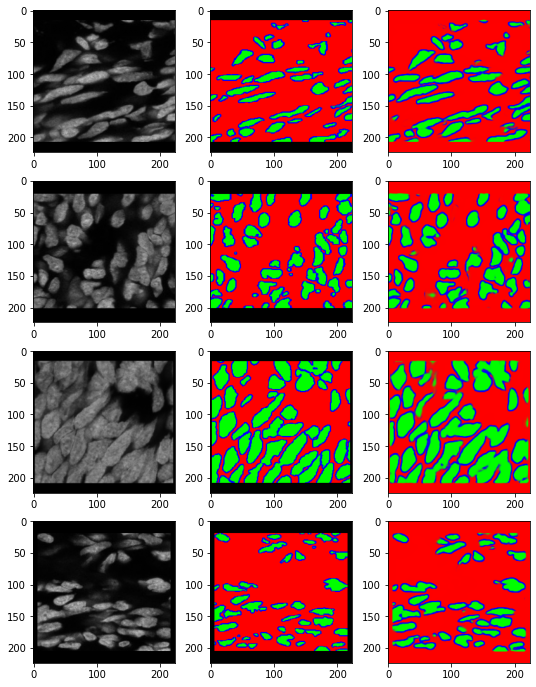

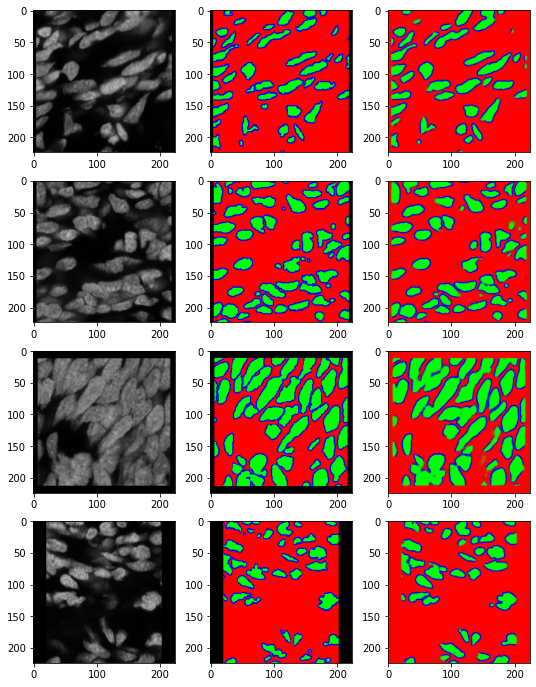

In [18]:
train(generator, discriminator, GAN, gen, valgen, root=OUTPUT)

In [19]:
raise

RuntimeError: No active exception to reraise

In [ ]:
model = sm.Unet("efficientnetb0", activation="softmax",
                input_shape=(224, 224, 3), encoder_weights='imagenet',
               classes=3)
model.load_weights('../models/model_unet_b0_0412_score_75_bowl.hdf5')
model.compile(optimizer="Adam", loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])

root = "/home/nathan/Desktop/data/dl_data/monitoring/"

for i in range(40):
    model.fit(x=gen, validation_data=valgen, epochs=1)
    viz_segment(model, valgen, idx=0, name=f"image_classic_{i}.png")
    model.save_weights(root + f'classic_model_{i}.h5')